In [65]:
import numpy as np
import matplotlib.pyplot as plt
from gco import pygco 
import cv2
import os

def calculate_color_distance(a, b):
    # 计算归一化的两个RGB颜色之间的绝对颜色距离 # Calculate the absolute color distance between two RGB colors
    return np.mean((a.astype(float)/255-b.astype(float)/255)**2)

#生成非均匀disparitymatrix # Generate non-uniform disparitymatrix
SizeofLayers = 50
# DisparityMatrix = [math.exp(i/10)/1000 for i in range(SizeofLayers)]
dmin = 0
dmax = 0.1
DisparityMatrix = np.linspace(dmin, dmax, SizeofLayers)
# print(len(DisparityMatrix))

# 加载cameras.txt中的相机矩阵 # load the cameras matrix in cameras.txt
CamerasNum = np.loadtxt('Road/Road/cameras.txt',dtype=np.float32, max_rows=1)
CamerasParameter = np.loadtxt('Road/Road/cameras.txt',dtype=np.float32, skiprows=1)
CamerasNum = int(CamerasNum)
print(CamerasNum)

K = []
R = []
T = []
for i in range(0, CamerasNum):
    K.append(CamerasParameter[7*i:7*i+3, :])
    R.append(CamerasParameter[7*i+3:7*i+6, :])
    T.append(CamerasParameter[7*i+6, :])

K = np.array(K)
R = np.array(R)
T = np.array(T)

print('K', K.shape, 'R', R.shape, 'T', T.shape)

# 文件夹路径 # Folder path
folder_path = 'Road/Road/src'

# 获取文件夹中的所有图像文件名 # Get all image file names in the folder
file_names = os.listdir(folder_path)

# 初始化空列表来存储图像数据 #Initialize an empty list to store image data
img_list = []

# 逐个加载和处理图像 # Load and process images one by one
for file_name in file_names:
    # 从文件名构建完整路径 # Build full path from filename
    file_path = os.path.join(folder_path, file_name)
    
    # 读取图像 # read image
    img = cv2.imread(file_path)
    
    # 将颜色通道从BGR转换为RGB # Convert color channels from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 将图像和展平后的图像添加到列表 # Add the image and the flattened image to the list
    img_list.append(img)


141
K (141, 3, 3) R (141, 3, 3) T (141, 3)


In [66]:
# parameters
sigma_c = 1
Height, Width, channel = img_list[0].shape
print(Height, Width)

540 960


In [67]:
UnaryPotentialArray = np.zeros([Height, Width, len(DisparityMatrix)])
result_frame = 100
num_frames = 15 
img1 = img_list[result_frame]
K1 = K[result_frame]
R1 = R[result_frame]
T1 = T[result_frame]

def CompareImageNorm(i1, i2):
    return np.linalg.norm((i1 - i2), ord=2, axis=-1, keepdims=True)

for i in range(result_frame - num_frames, result_frame):
    print(f"{(i-result_frame+num_frames+1)/num_frames:.2f}")
    K2 = K[i]
    R2 = R[i]
    T2 = T[i]
    img2 = img_list[i]
    ParameterMatrix1 = K2 @ R2.T @ R1 @ np.linalg.inv(K1)
    ParameterMatrix2 = K2 @ R2.T @ (T1-T2)
    UnaryPotentialArray_temp = np.zeros([Height, Width, len(DisparityMatrix)])
    # Create coordinate grid
    x, y = np.meshgrid(np.arange(Width), np.arange(Height))
    coords1 = np.stack((x, y, np.ones_like(x)), axis=-1)
    P_c_d = np.zeros([Height, Width, len(DisparityMatrix)])
    # print(coords1.shape)
    # print(coords1)
    # Iterate over disparity values
    for d in range(0, len(DisparityMatrix)-1):
        #print(d)
        coords2 = np.einsum('ij,klj->kli', ParameterMatrix1, coords1)
        a = ParameterMatrix2 * DisparityMatrix[d]
        # print('a', a)
        a = np.tile(a, (540, 960, 1))
        # print('coords2', coords2, "\n")
        # print('a', a, "\n")
        coords2 = coords2 + a
        # print('coords2', coords2.shape, "\n")        
        coords2_normalized = np.round( coords2 / coords2[..., 2, np.newaxis])
        # print('coords2_normalized', coords2_normalized)
        min_constraints = np.array([[0, 0, 0], # The minimum value constraints of 123 channels are all 0 # 123通道的最小值约束都为0 
                                    ])
        max_constraints = np.array([[Width - 1, Height - 1, 2], # The maximum value constraints of channel 123 are Height-1, Width-1, 2 respectively # 123通道的最大值约束分别为Height-1, Width-1, 2 
                                    ])
        coords2_normalized = np.clip(coords2_normalized, min_constraints, max_constraints)
        coords2_normalized = np.round(coords2_normalized).astype(int)
        # print('coords2_normalized_bounded', coords2_normalized.shape)
        coords2_normalized = coords2_normalized[:, :, 0:2]
        # print('coords2_normalized_bounded', coords2_normalized, coords2_normalized.shape)
        # print('img2.shape', img2.shape)
        rectified_img2 = img2[coords2_normalized[:, :, 1], coords2_normalized[:, :,0]]
        NormBetweenImg = CompareImageNorm(img1, rectified_img2)
        # print('consistency', consistency.shape)
        P_c = sigma_c / (sigma_c + NormBetweenImg)
        # print(P_c.shape)
        P_c_d[:, :, d] += P_c[:, :, 0]
        u = 1 / np.max(P_c_d, axis=2)
        # print('u', u.shape)
        UnaryPotentialArray_temp = 1-u[:, :, np.newaxis] * P_c_d
        # print('UnaryPotentialArray_temp', UnaryPotentialArray_temp.shape)
    UnaryPotentialArray += UnaryPotentialArray_temp
print('Initialization finished!')                           

0.07
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (540, 960, 50)
u (540, 960)
UnaryPotentialArray_temp (54

In [68]:
# # maxUPA = np.max(UnaryPotentialArray)
# # print(UnaryPotentialArray.shape)
# max_value_third_dim = np.max(UnaryPotentialArray, axis=2)
# # print(max_value_third_dim.shape)
# divisor_expanded = np.expand_dims(max_value_third_dim, axis=2)
# UnaryPotentialArray = 1 - UnaryPotentialArray / divisor_expanded
# print(UnaryPotentialArray.shape)

PairwisePotentialEnergyMatrix = np.zeros((SizeofLayers, SizeofLayers))
for i in range(SizeofLayers):
    for j in range(SizeofLayers):
        PairwisePotentialEnergyMatrix[i, j] = ((i - j)**2)/((SizeofLayers-1)**2)

In [69]:
epsilon = 50 # epsilon controls the constrast sensitivity
ws = 1 # ws denote the smoothness strength

my_cost_v = np.zeros([Height-1, Width])
my_cost_h = np.zeros([Height, Width-1])
U_x = np.zeros([Height, Width])
for y in range(Height):
    for x in range(Width):
        lamda_coord = []
        if y-1>=0:
            lamda_coord.append(img1[y-1][x]) 
        if y+1<Height:
            lamda_coord.append(img1[y+1][x]) 
        if x+1<Width:
            lamda_coord.append(img1[y][x+1])
        if x-1>=0:
            lamda_coord.append(img1[y][x-1])
            
        lamda_coord = np.array(lamda_coord)
        point_shape = lamda_coord.shape[0]
        This_norm = 0
        for j in range(point_shape):
            This_norm += 1 / (calculate_color_distance(img1[y][x], lamda_coord[j]) + epsilon)
        U_x[y][x] = point_shape/This_norm
for y in range(Height-1):
    for x in range(Width):          
        point_v = img1[y-1][x]
        my_cost_v[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_v) + epsilon)
for y in range(Height):
    for x in range(Width-1):     
        point_h = img1[y][x+1]
        my_cost_h[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_h) + epsilon)

my_cost_v = my_cost_v/np.max(my_cost_v)
my_cost_h = my_cost_h/np.max(my_cost_h)

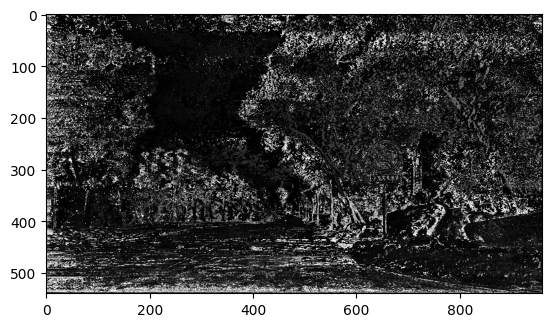

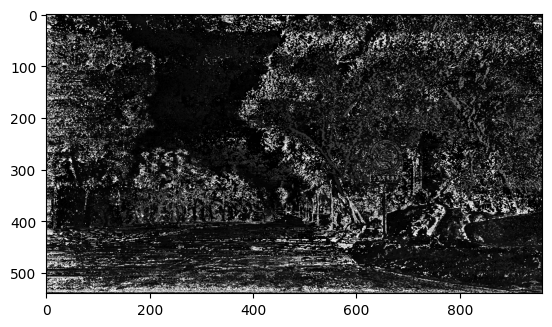

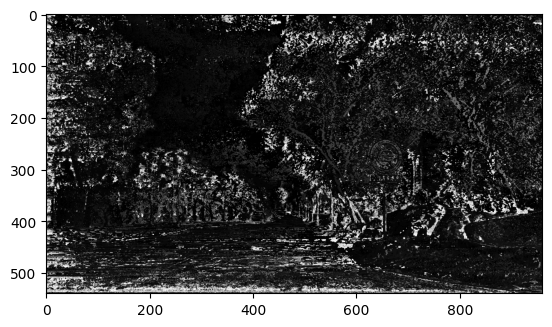

In [70]:
lambda_values = [0.01, 0.1, 1]
for loop_lambda in lambda_values:
    # print(UnaryPotentialArray.shape, PairwisePotentialEnergyMatrix.shape, lambda_v.shape, lambda_h.shape)
    video_label = pygco.cut_grid_graph(UnaryPotentialArray, PairwisePotentialEnergyMatrix*loop_lambda, my_cost_v, my_cost_h, n_iter=-1, algorithm='swap')
    video_label = video_label.reshape(Height, Width)
    plt.imshow(video_label, cmap="gray")
    plt.show()

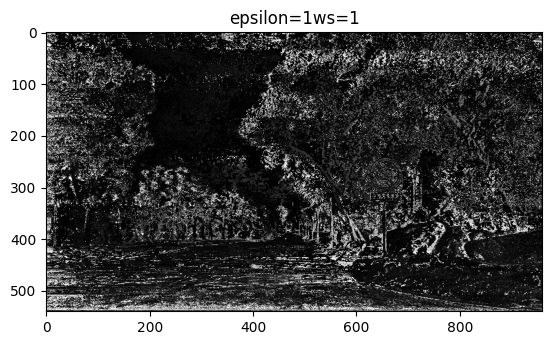

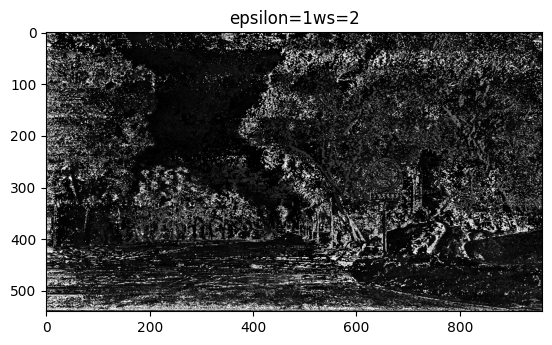

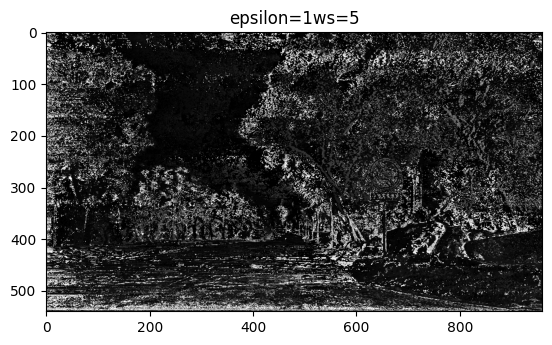

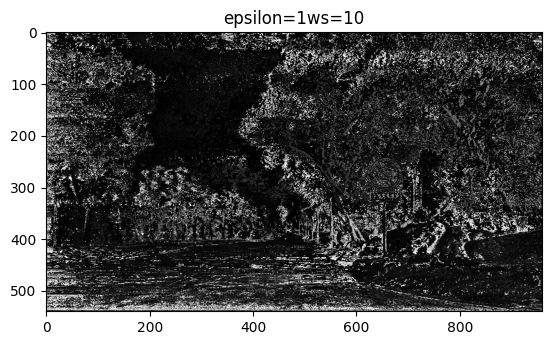

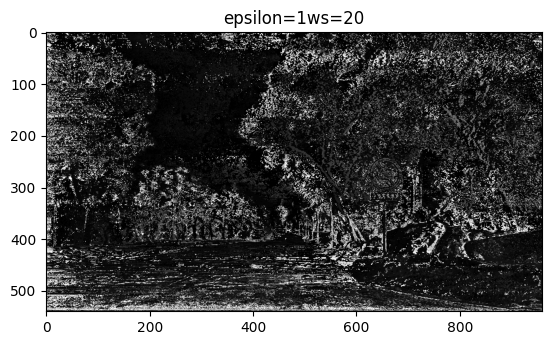

...

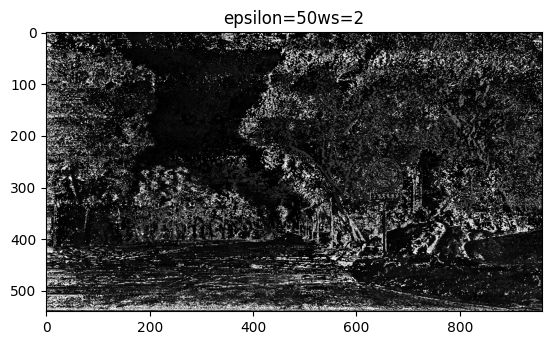

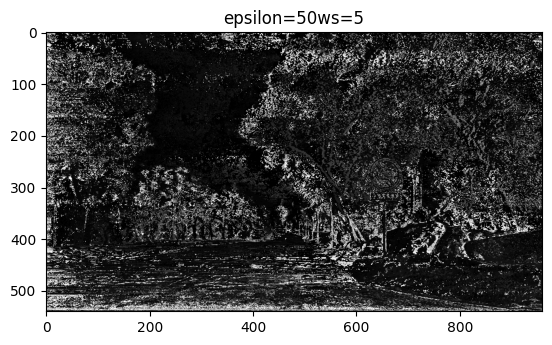

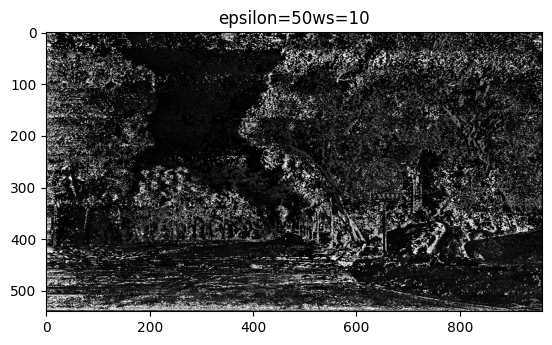

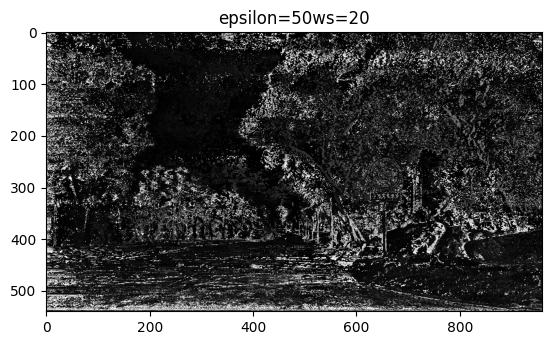

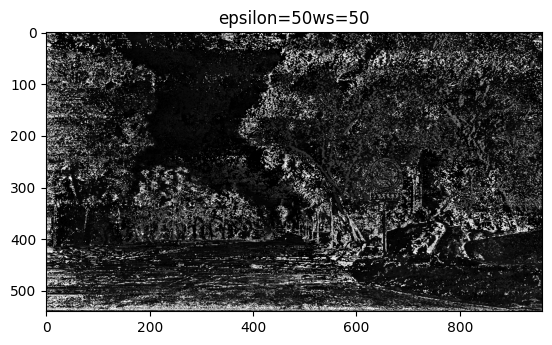

In [43]:
epsilons = [1, 2, 5, 10, 20, 50] # epsilon controls the constrast sensitivity
wss = [1, 2, 5, 10, 20, 50] # ws denote the smoothness strength

for epsilon in epsilons:
    for ws in wss:
        my_cost_v = np.zeros([Height-1, Width])
        my_cost_h = np.zeros([Height, Width-1])
        U_x = np.zeros([Height, Width])
        for y in range(Height):
            for x in range(Width):
                lamda_coord = []
                if y-1>=0:
                    lamda_coord.append(img1[y-1][x]) 
                if y+1<Height:
                    lamda_coord.append(img1[y+1][x]) 
                if x+1<Width:
                    lamda_coord.append(img1[y][x+1])
                if x-1>=0:
                    lamda_coord.append(img1[y][x-1])
                    
                lamda_coord = np.array(lamda_coord)
                point_shape = lamda_coord.shape[0]
                This_norm = 0
                for j in range(point_shape):
                    This_norm += 1 / (calculate_color_distance(img1[y][x], lamda_coord[j]) + epsilon)
                U_x[y][x] = point_shape/This_norm
        for y in range(Height-1):
            for x in range(Width):          
                point_v = img1[y-1][x]
                my_cost_v[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_v) + epsilon)
        for y in range(Height):
            for x in range(Width-1):     
                point_h = img1[y][x+1]
                my_cost_h[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_h) + epsilon)

        my_cost_v = my_cost_v/np.max(my_cost_v)
        my_cost_h = my_cost_h/np.max(my_cost_h)
        
        
        video_label = pygco.cut_grid_graph(UnaryPotentialArray, PairwisePotentialEnergyMatrix*0.01, my_cost_v, my_cost_h, n_iter=-1, algorithm='swap')
        video_label = video_label.reshape(Height, Width)
        plt.imshow(video_label, cmap="gray")
        plt.title('epsilon='f"{epsilon}"'ws='f"{ws}")
        plt.show()

###  BUNDLE OPTIMIZATION

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from gco import pygco 
import cv2
import os

def calculate_color_distance(a, b):
    # 计算归一化的两个RGB颜色之间的绝对颜色距离 # Calculate the absolute color distance between two RGB colors
    return np.mean((a.astype(float)/255-b.astype(float)/255)**2)

#生成非均匀disparitymatrix # Generate non-uniform disparitymatrix
SizeofLayers = 50
# DisparityMatrix = [math.exp(i/10)/1000 for i in range(SizeofLayers)]
dmin = 0.0
dmax = 0.1
DisparityMatrix = np.linspace(dmin, dmax, SizeofLayers)
# print(len(DisparityMatrix))

# 加载cameras.txt中的相机矩阵 # load the cameras matrix in cameras.txt
CamerasNum = np.loadtxt('Road/Road/cameras.txt',dtype=np.float32, max_rows=1)
CamerasParameter = np.loadtxt('Road/Road/cameras.txt',dtype=np.float32, skiprows=1)
CamerasNum = int(CamerasNum)
print(CamerasNum)

K = []
R = []
T = []
for i in range(0, CamerasNum):
    K.append(CamerasParameter[7*i:7*i+3, :])
    R.append(CamerasParameter[7*i+3:7*i+6, :])
    T.append(CamerasParameter[7*i+6, :])

K = np.array(K)
R = np.array(R)
T = np.array(T)

print('K', K.shape, 'R', R.shape, 'T', T.shape)

# 文件夹路径 # Folder path
folder_path = 'Road/Road/src'

# 获取文件夹中的所有图像文件名 # Get all image file names in the folder
file_names = os.listdir(folder_path)

# 初始化空列表来存储图像数据 #Initialize an empty list to store image data
img_list = []

# 逐个加载和处理图像 # Load and process images one by one
for file_name in file_names:
    # 从文件名构建完整路径 # Build full path from filename
    file_path = os.path.join(folder_path, file_name)
    
    # 读取图像 # read image
    img = cv2.imread(file_path)
    
    # 将颜色通道从BGR转换为RGB # Convert color channels from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    # 将图像和展平后的图像添加到列表 # Add the image and the flattened image to the list
    img_list.append(img)
    
Height, Width, channel = img_list[0].shape

141
K (141, 3, 3) R (141, 3, 3) T (141, 3)


In [17]:
UnaryPotentialArray = np.zeros([Height, Width, len(DisparityMatrix)])
result_frame = 100
num_frames = 15 
img1 = img_list[result_frame]
K1 = K[result_frame]
R1 = R[result_frame]
T1 = T[result_frame]

def CompareImageNorm(i1, i2):
    return np.linalg.norm((i1 - i2), ord=2, axis=-1, keepdims=True)

def MyBundle(sigma_c, sigma_d):
    for i in range(result_frame - num_frames, result_frame):
        print(f"{(i-result_frame+num_frames+1)/num_frames:.2f}")
        K2 = K[i]
        R2 = R[i]
        T2 = T[i]
        img2 = img_list[i]
        ParameterMatrix1 = K2 @ R2.T @ R1 @ np.linalg.inv(K1)
        ParameterMatrix2 = K2 @ R2.T @ (T1-T2)
        UnaryPotentialArray = np.zeros([Height, Width, len(DisparityMatrix)])
        # Create coordinate grid
        x, y = np.meshgrid(np.arange(Width), np.arange(Height))
        coords1 = np.stack((x, y, np.ones_like(x)), axis=-1)
        # print(coords1.shape)
        # print(coords1)
        # Iterate over disparity values
        P_c_d = np.zeros([Height, Width, len(DisparityMatrix)])
        P_v_d = np.zeros([Height, Width, len(DisparityMatrix)])
        for d in range(0, len(DisparityMatrix)-1):
            #print(d)
            coords2 = np.einsum('ij,klj->kli', ParameterMatrix1, coords1)
            a = ParameterMatrix2 * DisparityMatrix[d]
            # print('a', a)
            a = np.tile(a, (540, 960, 1))
            # print('coords2', coords2, "\n")
            # print('a', a, "\n")
            coords2 = coords2 + a
            # print('coords2', coords2.shape, "\n")        
            coords2_normalized = np.round( coords2 / coords2[..., 2, np.newaxis])
            # print('coords2_normalized', coords2_normalized)
            min_constraints = np.array([[0, 0, 0], # The minimum value constraints of 123 channels are all 0 # 123通道的最小值约束都为0 
                                        ])
            max_constraints = np.array([[Width - 1, Height - 1, 2], # The maximum value constraints of channel 123 are Height-1, Width-1, 2 respectively # 123通道的最大值约束分别为Height-1, Width-1, 2 
                                        ])
            coords2_normalized = np.clip(coords2_normalized, min_constraints, max_constraints)
            coords2_normalized = np.round(coords2_normalized).astype(int)
            # print('coords2_normalized_bounded', coords2_normalized.shape)
            coords2_normalized = coords2_normalized[:, :, 0:2]
            # print('coords2_normalized_bounded', coords2_normalized, coords2_normalized.shape)
            # print('img2.shape', img2.shape)
            rectified_img2 = img2[coords2_normalized[:, :, 1], coords2_normalized[:, :,0]]
            NormBetweenImg = CompareImageNorm(img1, rectified_img2)
            sigma_c = sigma_c * np.ones_like(NormBetweenImg)
            P_c = sigma_c / (sigma_c + NormBetweenImg)
            P_c_d[:, :, d] += P_c[:, :, 0]
            # print('P_c_d', P_c_d.shape)
            P_v = np.exp(-CompareImageNorm(coords1[:,:,[0,1]],coords2_normalized) / (2 * sigma_d ** 2))
            P_v_d[:, :, d] += P_v[:, :, 0]
            # print('P_v_d', P_v_d.shape)
        UnaryPotentialArray += np.multiply(P_c_d, P_v_d)
        # print('UnaryPotentialArray', UnaryPotentialArray)
    return UnaryPotentialArray
            
sigma_c = 1
sigma_d = 100         
UnaryPotentialArray = MyBundle(sigma_c, sigma_d)
        

0.07
0.13
0.20
0.27
0.33
0.40
0.47
0.53
0.60
0.67
0.73
0.80
0.87
0.93
1.00


In [18]:
maxUPA = np.max(UnaryPotentialArray)
UnaryPotentialArray = 1 - UnaryPotentialArray / maxUPA
print(UnaryPotentialArray.shape)

PairwisePotentialEnergyMatrix = np.zeros((SizeofLayers, SizeofLayers))
for i in range(SizeofLayers) :
    for j in range(SizeofLayers):
        PairwisePotentialEnergyMatrix[i, j] = ((i - j)**2)/((SizeofLayers-1)**2)

(540, 960, 50)


In [12]:
epsilon = 50 # epsilon controls the constrast sensitivity
ws = 1 # ws denote the smoothness strength

my_cost_v = np.zeros([Height-1, Width])
my_cost_h = np.zeros([Height, Width-1])
U_x = np.zeros([Height, Width])
for y in range(Height):
    for x in range(Width):
        lamda_coord = []
        if y-1>=0:
            lamda_coord.append(img1[y-1][x]) 
        if y+1<Height:
            lamda_coord.append(img1[y+1][x]) 
        if x+1<Width:
            lamda_coord.append(img1[y][x+1])
        if x-1>=0:
            lamda_coord.append(img1[y][x-1])
            
        lamda_coord = np.array(lamda_coord)
        point_shape = lamda_coord.shape[0]
        This_norm = 0
        for j in range(point_shape):
            This_norm += 1 / (calculate_color_distance(img1[y][x], lamda_coord[j]) + epsilon)
        U_x[y][x] = point_shape/This_norm
for y in range(Height-1):
    for x in range(Width):          
        point_v = img1[y-1][x]
        my_cost_v[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_v) + epsilon)
for y in range(Height):
    for x in range(Width-1):     
        point_h = img1[y][x+1]
        my_cost_h[y][x] = U_x[y][x] * ws / (calculate_color_distance(img1[y][x], point_h) + epsilon)

my_cost_v = my_cost_v/np.max(my_cost_v)
my_cost_h = my_cost_h/np.max(my_cost_h)

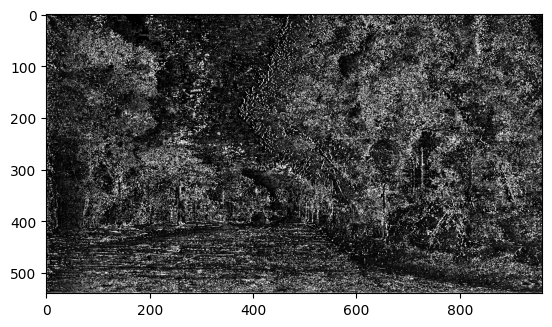

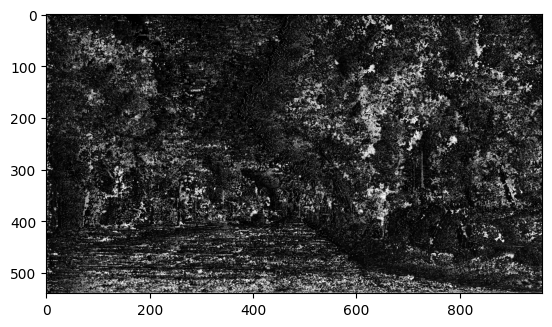

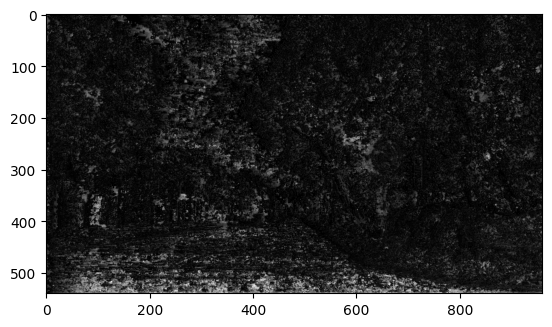

In [19]:
lambda_values = [0.01, 0.1, 1]
for loop_lambda in lambda_values:
    # print(UnaryPotentialArray.shape, PairwisePotentialEnergyMatrix.shape, lambda_v.shape, lambda_h.shape)
    video_label = pygco.cut_grid_graph(UnaryPotentialArray, PairwisePotentialEnergyMatrix*loop_lambda, my_cost_v, my_cost_h, n_iter=-1, algorithm='swap')
    video_label = video_label.reshape(Height, Width)
    plt.imshow(video_label, cmap="gray")
    plt.show()